In [1]:
import pandas as pd
import numpy as np
import ast

df = pd.read_csv("data/board-game.csv")
print(df.columns)

Index(['Name', 'Year', 'min_players', 'max_players', 'min_playtime',
       'max_playtime', 'min_age', 'category', 'mechanic', 'userrated',
       'avg_rate', 'rank', 'owned', 'trading', 'wanting', 'wishing',
       'num_comments', 'num_weights', 'avg_weight'],
      dtype='object')


## Preprocessing: Encoding Categories and Mechanics

In this section, we use MultiLabelBinarizer to encode categories as a numeric array.

Convert the column to correct format for the encoder.

In [2]:
print(df['category'].head(5))

df['category'] = df['category'].apply(lambda x: ','.join(ast.literal_eval(x)))
# df['mechanic'] = df['mechanic'].apply(lambda x: ','.join(ast.literal_eval(x)))

print()
print(df['category'].head(5))

0      ['Card Game', 'Medieval', 'Territory Building']
1    ['Card Game', 'Science Fiction', 'Space Explor...
2                                ['Abstract Strategy']
3                                        ['Card Game']
4                                        ['Card Game']
Name: category, dtype: object

0          Card Game,Medieval,Territory Building
1    Card Game,Science Fiction,Space Exploration
2                              Abstract Strategy
3                                      Card Game
4                                      Card Game
Name: category, dtype: object


In [3]:
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer()
encoded_data = mlb.fit_transform(df['category'].str.split(","))
print(mlb.classes_.shape)

(84,)


In [4]:
# We can use `inverse_transform` to convert encoded_data to the original categories
mlb.inverse_transform(encoded_data)

[('Card Game', 'Medieval', 'Territory Building'),
 ('Card Game', 'Science Fiction', 'Space Exploration'),
 ('Abstract Strategy',),
 ('Card Game',),
 ('Card Game',),
 ('Economic', 'Trains'),
 ('Aviation / Flight', 'Card Game'),
 ('Card Game', 'Collectible Components', 'Fantasy', 'Horror', 'Novel-based'),
 ('Card Game',),
 ('Economic', 'Exploration', 'Nautical', 'Renaissance'),
 ('Card Game', 'Fantasy', 'Fighting'),
 ('Bluffing', 'Card Game'),
 ('Deduction', 'Party Game'),
 ('Card Game', 'Modern Warfare', 'Wargame'),
 ('Ancient', 'Civilization', 'Economic', 'Mythology', 'Wargame'),
 ('Abstract Strategy', 'Ancient', 'Civilization', 'Territory Building'),
 ('Adventure', 'Exploration', 'Fighting', 'Miniatures', 'Science Fiction'),
 ('Card Game', 'City Building', 'Economic', 'Science Fiction'),
 ('City Building', 'Dice'),
 ('American West', 'Animals', 'Economic'),
 ('Adventure', 'Dice', 'Horror', 'Trains'),
 ('Adventure', 'Ancient', 'Card Game', 'Exploration'),
 ('Animals', 'Fantasy', 'Nauti

In [5]:
data = pd.DataFrame(encoded_data, columns=mlb.classes_)

df_categories = pd.concat([df, data], axis=1)
df_categories.drop(['Name', 'category', 'mechanic'], axis=1, inplace=True)
df_categories

,Year,min_players,max_players,min_playtime,max_playtime,min_age,userrated,avg_rate,rank,owned,...,Transportation,Travel,Trivia,Video Game Theme,Vietnam War,Wargame,Word Game,World War I,World War II,Zombies
0,2021,3,5,60,90,14,3003,7.55005,774,4200,...,0,0,0,0,0,0,0,0,0,0
1,2017,2,4,10,30,13,4510,6.99382,1123,6348,...,0,0,0,0,0,0,0,0,0,0
2,2001,2,2,30,30,9,4960,7.45702,591,6917,...,0,0,0,0,0,0,0,0,0,0
3,2019,2,6,15,30,8,17480,7.17658,462,29303,...,0,0,0,0,0,0,0,0,0,0
4,2014,2,5,20,20,10,4926,6.99363,1072,7998,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,2015,1,4,60,90,12,5261,7.18274,805,8574,...,0,0,0,0,0,0,0,0,0,0
1996,2022,1,5,30,75,10,2457,7.64693,875,4190,...,0,0,0,0,0,0,0,0,0,0
1997,2020,2,5,40,80,8,3055,7.34986,1090,8963,...,0,0,0,1,0,0,0,0,0,0
1998,2007,3,5,60,90,12,4710,7.15592,892,3204,...,1,0,0,0,0,0,0,0,0,0


## t-SNE: Visualize High Dimensional Data

In this section, we apply t-Distributed Stochastic Neighbor Embedding (t-SNE) to visualize high dimensional data using Feature Extraction. t-SNE will maximize distance in two-dimensional space between observations that are most different in a high dimensional space. Because of this, observations that are similar be close to one another and may become clustered.

In [6]:
from sklearn.manifold import TSNE

model = TSNE()
tsne_features = model.fit_transform(df_categories)

# Checking the first three rows generated by TSNE
tsne_features[1:4, :]

array([[-3.7979057, -1.3265458],
       [ 3.182274 , -2.0032537],
       [67.90607  , -3.966914 ]], dtype=float32)

In [7]:
df_categories['x'] = tsne_features[:, 0]
df_categories['y'] = tsne_features[:, 1]

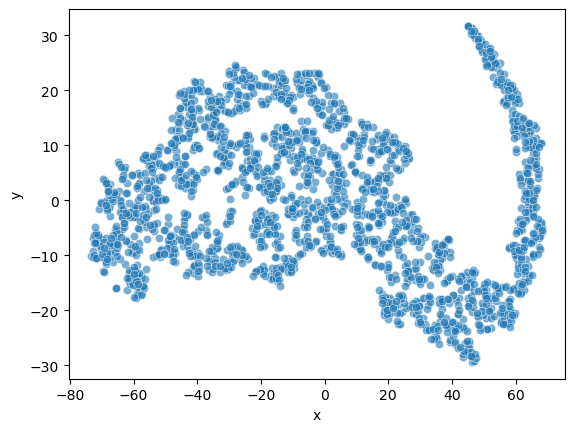

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.scatterplot(x='x', y='y', data=df_categories, alpha=0.6)
plt.show()

After plotting each category, we can not find any obvious distribution in the whole dataset. Therefore, we can drop `Category`. Same for `Mechanic`.

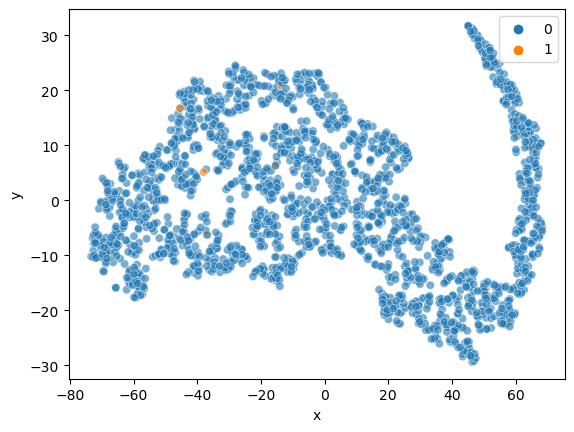

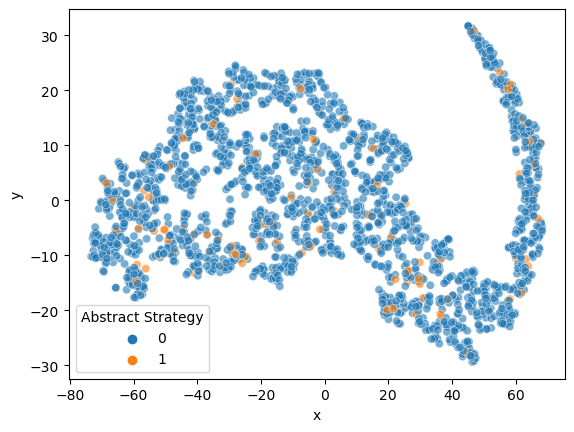

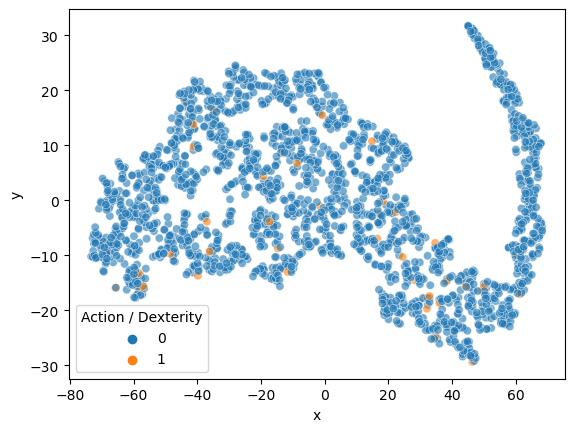

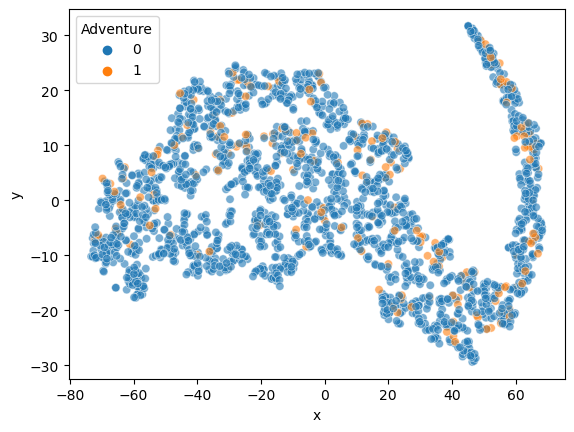

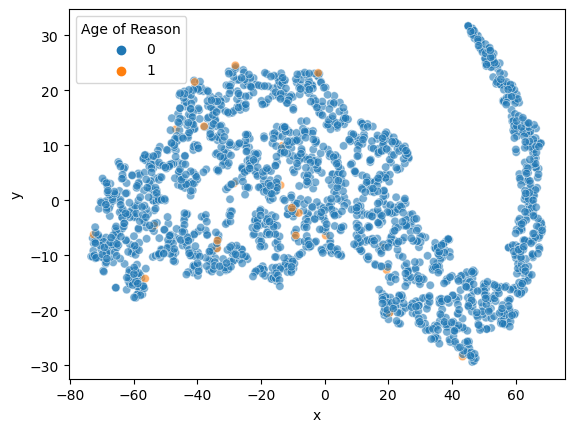

...

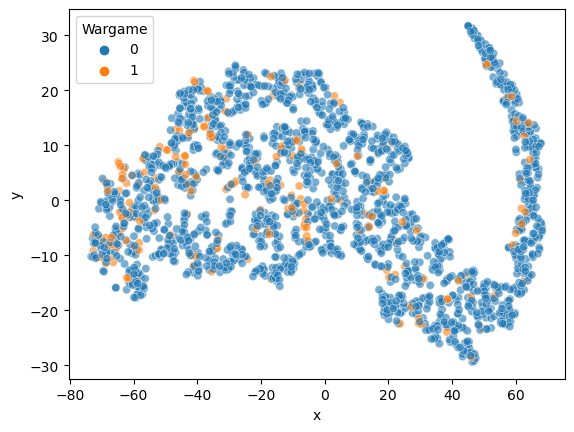

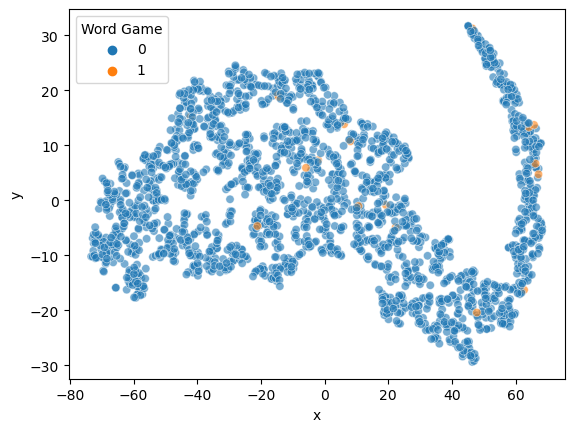

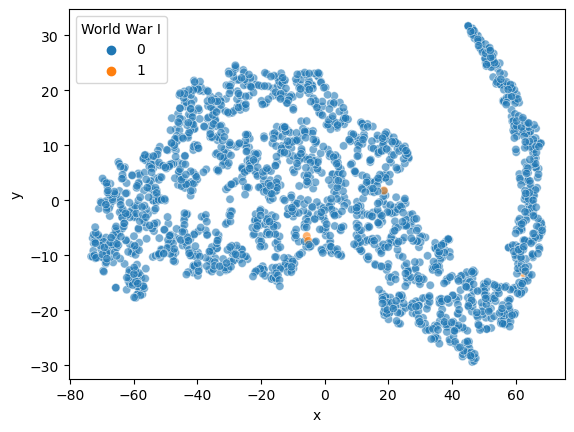

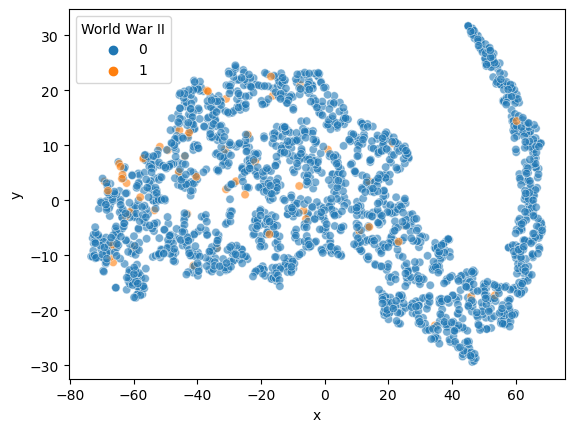

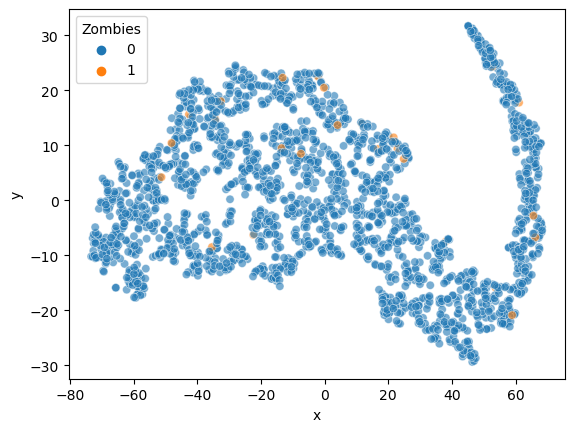

In [9]:
for category in mlb.classes_:
    sns.scatterplot(x='x', y='y', hue=category, data=df_categories, alpha=0.6)
    plt.show()